In [55]:
import pandas as pd
import nltk
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
nltk.download
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('vader_lexicon')
!pip install ekphrasis
!pip install tweet-preprocessor
import preprocessor as p
import matplotlib.pyplot as plt

tweets = pd.read_csv('tweets.csv')
tweets.head()

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/mohamadkhalili/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/mohamadkhalili/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/mohamadkhalili/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/mohamadkhalili/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


,Unnamed: 0,content,username,mentioned_users,tokenized_text
0,0,@MLInstitute @SFOMLI @jamiljivani @shuvmajumda...,': 'DouglasTodd',"['MLInstitute', 'SFOMLI', 'jamiljivani', 'shuv...","['mlinstitute', 'sfomli', 'jamiljivani', 'shuv..."
1,1,Conservatives want Two-Tier for-profit health....,': 'sblogga',none,"['conservatives', 'want', 'twotier', 'forprofi..."
2,2,Looking forward to moderating this timely pane...,': 'zpaikin',none,"['looking', 'forward', 'moderating', 'timely',..."
3,3,#cdnpoli https://t.co/SsBJXWYoOj,': 'robertbenzie',none,"['cdnpoli', 'twittercomreggcohnstatu', '…']"
4,4,https://t.co/phGcXD9oLK #BCpoli #cdnpoli,': 'OrcaCedarbough',none,"['theguardiancomenvironment', '…', 'bcpoli', '..."


In [56]:
tweets = tweets.drop(columns = ['Unnamed: 0', 'username', 'mentioned_users', 'tokenized_text'])

In [57]:
tweets.head()

,content
0,@MLInstitute @SFOMLI @jamiljivani @shuvmajumda...
1,Conservatives want Two-Tier for-profit health....
2,Looking forward to moderating this timely pane...
3,#cdnpoli https://t.co/SsBJXWYoOj
4,https://t.co/phGcXD9oLK #BCpoli #cdnpoli


In [58]:
def preprocess_tweet(row):
    text = row['content']
    text = p.clean(text)
    return text

tweets['Normal_Text'] = tweets.apply(preprocess_tweet, axis=1)
tweets.head()
tweets = tweets.dropna()

#Removing stopwords
stop = stopwords.words('english')
tweets['Clean_Tweet'] = tweets['Normal_Text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))

#Lowercasing the tweets:
for i in range(len(tweets)):
    tweets['Clean_Tweet'][i] = tweets['Clean_Tweet'][i].lower()
    
#Removing punctuation:
import string
def remove_punct(txt):
    text_nopunct= "".join([char for char in txt if char not in string.punctuation])
    return text_nopunct
tweets['Finished_Tweet']= tweets['Clean_Tweet'].apply(lambda x: remove_punct(x))


#Tokenizing into words:
    
tweets['tokenized_tweet'] = 0
for i in range(len(tweets)):
    tweets['tokenized_tweet'][i] = word_tokenize(tweets['Finished_Tweet'][i])
    
tweets.head()

/var/folders/1c/ggccb2c123ndgb2d4lvtql_h0000gn/T/ipykernel_75420/4279015864.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets['tokenized_tweet'][i] = word_tokenize(tweets['Finished_Tweet'][i])
/Users/mohamadkhalili/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,content,Normal_Text,Clean_Tweet,Finished_Tweet,tokenized_tweet
0,@MLInstitute @SFOMLI @jamiljivani @shuvmajumda...,"/ The claims the ""mainstream media narrative s...","/ the claims ""mainstream media narrative seems...",the claims mainstream media narrative seems o...,"[the, claims, mainstream, media, narrative, se..."
1,Conservatives want Two-Tier for-profit health....,Conservatives want Two-Tier for-profit health....,conservatives want two-tier for-profit health....,conservatives want twotier forprofit health th...,"[conservatives, want, twotier, forprofit, heal..."
2,Looking forward to moderating this timely pane...,Looking forward to moderating this timely pane...,looking forward moderating timely panel .,looking forward moderating timely panel,"[looking, forward, moderating, timely, panel]"
3,#cdnpoli https://t.co/SsBJXWYoOj,,,,[]
4,https://t.co/phGcXD9oLK #BCpoli #cdnpoli,,,,[]


In [59]:
indices_to_drop = []
for i in range(len(tweets)):
    if len(tweets.tokenized_tweet[i]) == 0:
        indices_to_drop.append(tweets.index[i])

tweets = tweets.drop(indices_to_drop)
tweets = tweets.reset_index(drop = True)
tweets.head()

,content,Normal_Text,Clean_Tweet,Finished_Tweet,tokenized_tweet
0,@MLInstitute @SFOMLI @jamiljivani @shuvmajumda...,"/ The claims the ""mainstream media narrative s...","/ the claims ""mainstream media narrative seems...",the claims mainstream media narrative seems o...,"[the, claims, mainstream, media, narrative, se..."
1,Conservatives want Two-Tier for-profit health....,Conservatives want Two-Tier for-profit health....,conservatives want two-tier for-profit health....,conservatives want twotier forprofit health th...,"[conservatives, want, twotier, forprofit, heal..."
2,Looking forward to moderating this timely pane...,Looking forward to moderating this timely pane...,looking forward moderating timely panel .,looking forward moderating timely panel,"[looking, forward, moderating, timely, panel]"
3,Why Doug Ford will win re-election easily - Th...,Why Doug Ford will win re-election easily - Th...,why doug ford win re-election easily - thread,why doug ford win reelection easily thread,"[why, doug, ford, win, reelection, easily, thr..."
4,@SrushtiGangdev 100% agree! Blows my mind they...,% agree! Blows my mind they don't realize the ...,% agree! blows mind realize harm doing. fuelin...,agree blows mind realize harm doing fueling c...,"[agree, blows, mind, realize, harm, doing, fue..."


In [61]:
from sklearn.feature_extraction.text import CountVectorizer
from gensim.corpora import Dictionary
from gensim.models.ldamodel import LdaModel
from gensim.models import CoherenceModel
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from datetime import datetime
import nltk
nltk.download('stopwords')
import pandas as pd
import re
import math

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/mohamadkhalili/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [62]:
def get_most_freq_words(str, n=None):
    vect = CountVectorizer().fit(str)
    bag_of_words = vect.transform(str)
    sum_words = bag_of_words.sum(axis=0) 
    freq = [(word, sum_words[0, idx]) for word, idx in vect.vocabulary_.items()]
    freq =sorted(freq, key = lambda x: x[1], reverse=True)
    return freq[:n]
  
get_most_freq_words([ word for tweet in tweets.tokenized_tweet for word in tweet],100)

[('amp', 1312),
 ('the', 1048),
 ('canada', 874),
 ('party', 745),
 ('this', 639),
 ('people', 567),
 ('election', 547),
 ('trudeau', 513),
 ('would', 495),
 ('get', 477),
 ('us', 460),
 ('one', 454),
 ('canadian', 450),
 ('it', 439),
 ('leader', 434),
 ('like', 432),
 ('time', 415),
 ('government', 412),
 ('need', 399),
 ('canadians', 389),
 ('says', 372),
 ('new', 365),
 ('we', 357),
 ('you', 340),
 ('federal', 336),
 ('paul', 320),
 ('alberta', 316),
 ('right', 305),
 ('china', 304),
 ('green', 281),
 ('and', 279),
 ('know', 278),
 ('think', 275),
 ('if', 274),
 ('political', 271),
 ('public', 268),
 ('its', 267),
 ('annamie', 262),
 ('many', 257),
 ('not', 255),
 ('health', 253),
 ('good', 253),
 ('in', 252),
 ('make', 249),
 ('want', 247),
 ('take', 241),
 ('media', 239),
 ('see', 238),
 ('well', 233),
 ('now', 230),
 ('news', 230),
 ('could', 230),
 ('canadas', 226),
 ('leadership', 225),
 ('still', 225),
 ('vote', 225),
 ('covid', 223),
 ('also', 219),
 ('what', 214),
 ('going',

In [127]:
# Removing other words that create noise
words = ['amp',
         'people',
         'it',
         'in',
         'the',
         'this',
         'that',
         'their',
         'dont',
         'why',
         'i',
         'us',
         'go',
         'im',
         'how',
         'is',
         'canada',
         'canadas',
         'canadian',
         'also',
         'could',
         'now',
         'see',
         'take',
         'said',
         'and',
         'you',
         'we',
         'day',
         'de',
         'never',
         'so',
         'even',
         'what',
         'its',
         'if',
         'he',
         'get',
         'gets',
         'la',
         'no',
         'can',
         'cant',
         'one',
         'new',
         'time',
         'like',
         'two',
         'much',
         'back',
         'even',
         'going',
         'way',
         'could',
         'well',
         'take',
         'make',
         'not',
        'thats',
        'theyre',
        'theyve',
        'seek',
        'sense',
        'want',
        'out',
        'checking',
        'and',
        'retweet',
        'being']

In [128]:
tweets.tokenized_tweet == None

0       False
1       False
2       False
3       False
4       False
        ...  
9387    False
9388    False
9389    False
9390    False
9391    False
Name: tokenized_tweet, Length: 9392, dtype: bool

In [129]:
for i in range(len(tweets)):
    tweets.tokenized_tweet[i] = [x for x in tweets.tokenized_tweet[i] if x not in words]

In [131]:
tweets.tokenized_tweet[13]

['try',
 'view',
 'cultural',
 'study',
 'endorses',
 'removal',
 'statues',
 'spends',
 '103k',
 'refurbishing',
 'shabby',
 'fibreglass',
 'lemon',
 'statue',
 'cabinet',
 'ministers',
 'riding']

In [132]:
tweets_dictionary = Dictionary(tweets.tokenized_tweet)

In [133]:
tweets_corpus = [tweets_dictionary.doc2bow(tweet) for tweet in tweets.tokenized_tweet]

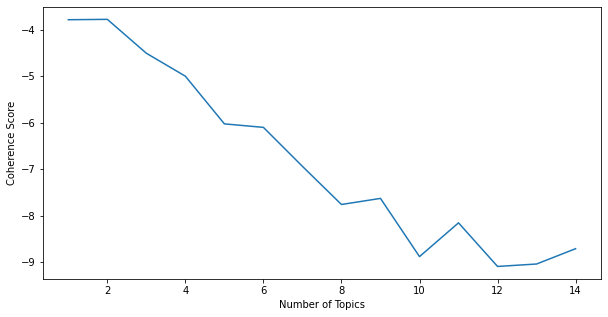

In [134]:
tweets_coherence = []
for nb_topics in range(1,15):
    lda = LdaModel(tweets_corpus, num_topics = nb_topics, id2word = tweets_dictionary, passes=10)
    cohm = CoherenceModel(model=lda, corpus=tweets_corpus, dictionary=tweets_dictionary, coherence='u_mass')
    coh = cohm.get_coherence()
    tweets_coherence.append(coh)

# visualize coherence
plt.figure(figsize=(10,5))
plt.plot(range(1,15),tweets_coherence)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score");

In [140]:
k = 4
tweets_lda = LdaModel(tweets_corpus, num_topics = k, id2word = tweets_dictionary, passes=10)

def plot_top_words(lda=tweets_lda, nb_topics=k, nb_words=10):
    top_words = [[word for word,_ in lda.show_topic(topic_id, topn=50)] for topic_id in range(lda.num_topics)]
    top_betas = [[beta for _,beta in lda.show_topic(topic_id, topn=50)] for topic_id in range(lda.num_topics)]

    gs  = gridspec.GridSpec(round(math.sqrt(k))+1,round(math.sqrt(k))+1)
    gs.update(wspace=0.5, hspace=0.5)
    plt.figure(figsize=(20,15))
    for i in range(nb_topics):
        ax = plt.subplot(gs[i])
        plt.barh(range(nb_words), top_betas[i][:nb_words], align='center',color='blue', ecolor='black')
        ax.invert_yaxis()
        ax.set_yticks(range(nb_words))
        ax.set_yticklabels(top_words[i][:nb_words])
        plt.title("Topic "+str(i))

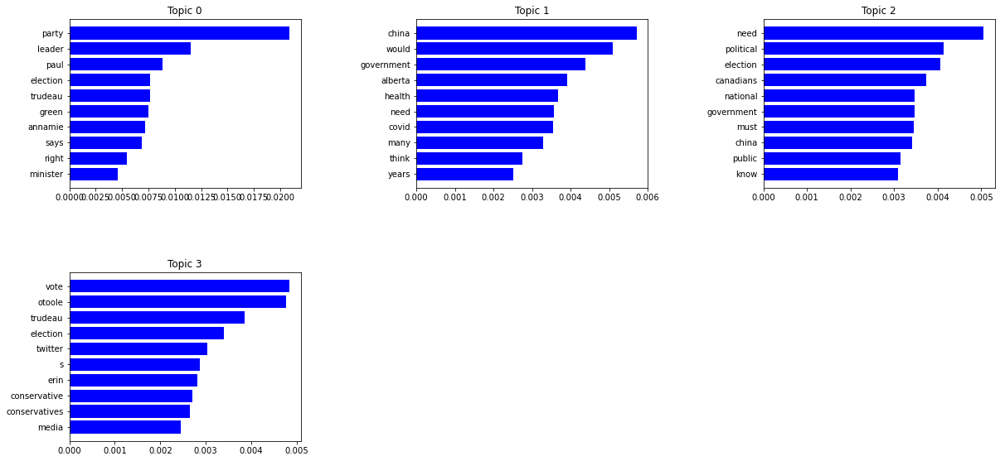

In [141]:
from matplotlib import gridspec
plot_top_words()

# METHOD 2

In [142]:
import gensim
from gensim.models import ldamulticore
from pprint import pprint
from gensim.models import coherencemodel

for k in range(2,20): # Train LDA on different values of k
    print('Round: '+str(k))
    LDA = gensim.models.ldamulticore.LdaMulticore
    ldamodel = LDA(tweets_corpus, num_topics=k, id2word = tweets_dictionary, passes=20, iterations=100,
                   chunksize = 10000, eval_every = 10, random_state=0)
    ldamodel.save(f"ldamodel_for_{k}topics_Run_10")
    pprint(ldamodel.print_topics())

Round: 2
[(0,
  '0.008*"party" + 0.005*"election" + 0.004*"leader" + 0.004*"paul" + '
  '0.004*"green" + 0.003*"annamie" + 0.003*"would" + 0.003*"many" + '
  '0.003*"federal" + 0.003*"china"'),
 (1,
  '0.006*"trudeau" + 0.004*"canadians" + 0.004*"would" + 0.003*"right" + '
  '0.003*"government" + 0.003*"election" + 0.003*"minister" + 0.003*"need" + '
  '0.003*"says" + 0.002*"pm"')]
Round: 3


/Users/mohamadkhalili/opt/anaconda3/lib/python3.8/site-packages/smart_open/smart_open_lib.py:400: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  warnings.warn(


[(0,
  '0.011*"party" + 0.006*"election" + 0.006*"leader" + 0.006*"paul" + '
  '0.005*"green" + 0.005*"annamie" + 0.004*"federal" + 0.004*"would" + '
  '0.003*"says" + 0.003*"government"'),
 (1,
  '0.006*"trudeau" + 0.004*"election" + 0.004*"party" + 0.004*"would" + '
  '0.004*"right" + 0.003*"need" + 0.003*"government" + 0.003*"canadians" + '
  '0.003*"says" + 0.003*"say"'),
 (2,
  '0.005*"canadians" + 0.004*"trudeau" + 0.004*"think" + 0.004*"know" + '
  '0.003*"would" + 0.003*"need" + 0.003*"minister" + 0.003*"public" + '
  '0.002*"covid" + 0.002*"china"')]
Round: 4
[(0,
  '0.014*"party" + 0.009*"leader" + 0.009*"paul" + 0.007*"annamie" + '
  '0.007*"green" + 0.007*"election" + 0.004*"leadership" + 0.004*"federal" + '
  '0.004*"would" + 0.004*"says"'),
 (1,
  '0.006*"party" + 0.005*"trudeau" + 0.004*"would" + 0.004*"canadians" + '
  '0.004*"leader" + 0.004*"election" + 0.003*"otoole" + 0.003*"need" + '
  '0.003*"say" + 0.003*"government"'),
 (2,
  '0.006*"trudeau" + 0.005*"canadians"

In [143]:
coherence = []
for k in range(2,20):
    LDA = gensim.models.ldamulticore.LdaMulticore
    ldamodel = LDA.load(f"ldamodel_for_{k}topics_Run_10")
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=tweets.tokenized_tweet, dictionary=tweets_dictionary, coherence='c_v')
    coherence.append((k, 'default', 'default', cm.get_coherence()))

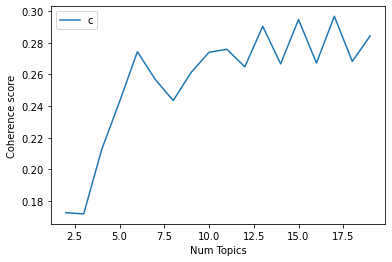

In [144]:
pd.DataFrame(coherence, columns=['LDA_Model','alpha','eta','coherence_score']).to_csv('coherence_matrix_10.csv', index=False)
mat = pd.read_csv('coherence_matrix_10.csv')
mat.reset_index(drop=True)
# Show graph
x = range(2,20)
plt.plot(x, mat['coherence_score'])
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [145]:
!pip install pyldavis

In [146]:
import pickle 
import pyLDAvis
import pyLDAvis.gensim_models

In [148]:
#LDA = gensim.models.ldamulticore.LdaMulticore

#ldamodel = LDA.load(f"ldamodel_for_16topics_Run_10")

#pyLDAvis.gensim_models.prepare(ldamodel, tweets_corpus, tweets_dictionary)

In [151]:
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import gridspec

k = 15
tweets_lda = LDA(tweets_corpus, num_topics = k, id2word = tweets_dictionary, passes=20)

def plot_top_words(lda=tweets_lda, nb_topics=k, nb_words=15):
    top_words = [[word for word,_ in lda.show_topic(topic_id, topn=50)] for topic_id in range(lda.num_topics)]
    top_betas = [[beta for _,beta in lda.show_topic(topic_id, topn=50)] for topic_id in range(lda.num_topics)]

    gs  = gridspec.GridSpec(round(math.sqrt(k))+1,round(math.sqrt(k))+1)
    gs.update(wspace=0.5, hspace=0.5)
    plt.figure(figsize=(25,20))
    
    for i in range(nb_topics):
        ax = plt.subplot(gs[i])
        plt.barh(range(nb_words), top_betas[i][:nb_words], align='center',color='blue', ecolor='black')
        ax.invert_yaxis()
        ax.set_yticks(range(nb_words))
        ax.set_yticklabels(top_words[i][:nb_words])
        plt.title("Topic "+str(i))
         

/Users/mohamadkhalili/opt/anaconda3/lib/python3.8/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/Users/mohamadkhalili/opt/anaconda3/lib/python3.8/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/Users/mohamadkhalili/opt/anaconda3/lib/python3.8/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.


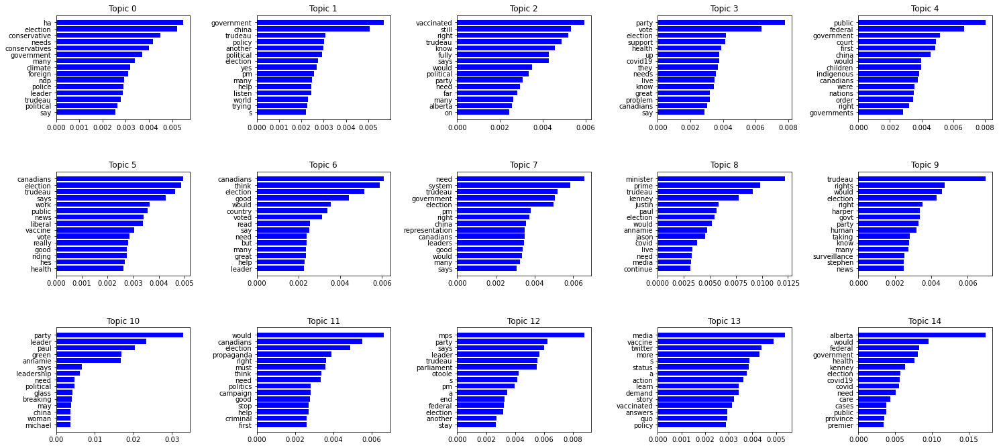

/Users/mohamadkhalili/opt/anaconda3/lib/python3.8/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/mohamadkhalili/opt/anaconda3/lib/python3.8/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/mohamadkhalili/opt/anaconda3/lib/python3.8/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/Users/mohamadkhalili/opt/anaconda3/lib/python3.8/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/mohamadkhalili/opt/anaconda3/lib/python3.8/site-packages/setuptools/_distutils

In [152]:
plot_top_words()

In [ ]:
# Most recurring topics
# Green Party of Canada: Annamie Paul
# COVID19 Pandemic
# Reconciliation with Indigenous Populations
# Justin Trudeau

In [86]:
tweets.tokenized_tweet

0       [the, claims, mainstream, media, narrative, se...
1       [conservatives, want, twotier, forprofit, heal...
2           [looking, forward, moderating, timely, panel]
3       [why, doug, ford, win, reelection, easily, thr...
4       [agree, blows, mind, realize, harm, doing, fue...
                              ...                        
9387    [just, see, ndp, base, defend, china, taking, ...
9388    [not, good, enough, ns, extraordinarly, well, ...
9389    [we, cake, on, beautiful, bc, daysuch, wonderf...
9390    [everything, price, point, when, employers, re...
9391    [agreed, if, really, wants, trust, constituent...
Name: tokenized_tweet, Length: 9392, dtype: object

In [87]:
a = range(1, 10)
print(a)

range(1, 10)


In [88]:
[x for x in a if x not in [2, 3, 7]]

[1, 4, 5, 6, 8, 9]

In [89]:
a = [x for x in a if x not in [2, 3, 7]]

In [90]:
print(a)

[1, 4, 5, 6, 8, 9]
